In [16]:
# import packages
import os
import sys
import glob
from pathlib import Path
import numpy as np
import torch
import pickle
from tqdm import tqdm
import copy
from core_settings import get_params

import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LogNorm, SymLogNorm
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
%matplotlib inline

In [17]:
# AE settings

# setup directories
script_dir = os.getcwd()
src_dir = str(Path(script_dir).parents[1])
print(f'{src_dir = }')
sys.path.append(src_dir)

MRP_dir = str(Path(script_dir).parents[2])
dataset_dir = os.path.join(MRP_dir, 'data/poly_dataset/time_series_dataset_hendrix')
# std_output_dir = os.path.join(MRP_dir, 'data/poly_dataset/std_output')
save_model_dir = os.path.join(MRP_dir, 'src/neural_nets/saved_models')

print(f'dataset_dir: {dataset_dir}')

# setup pytorch device
device = torch.device("cpu")


src_dir = '/data2/silk/Exo_Project/Emulator_VULCAN/src'
dataset_dir: /data2/silk/Exo_Project/Emulator_VULCAN/data/poly_dataset/time_series_dataset_hendrix


In [19]:
# get AE params
core_name = 'LSTM_old'
params = get_params(core_name)

# get model name
hparams = {}
hparams.update(params['core_model_params'])
hparams.update(params['optimizer_params'])
model_name = f'{params["name"]},{hparams=}'

image_dir = f'images/{model_name}/'
example_dir = f'images/{model_name}/examples'

if not os.path.isdir(image_dir):
    os.mkdir(image_dir)

if not os.path.isdir(example_dir):
    os.mkdir(example_dir)

# get perf dict
perf_dict_file = f'performance_dicts/{model_name}_perf_dict.pkl'
with open(perf_dict_file, 'rb') as f:
    perf_dict = pickle.load(f)

# perf_dict_file = f'performance_dicts/{model_name}_perf_dict_time_only.pkl'
# with open(perf_dict_file, 'rb') as f:
#     perf_dict_time = pickle.load(f)

# get species list
print('loading species list...')
species_file = os.path.join(dataset_dir, 'species_list.pkl')
with open(species_file, 'rb') as f:
    spec_list = pickle.load(f)

print('extracting inputs and outputs...')
x = perf_dict['actual']
x_pred = perf_dict['predictions']
# core_times = perf_dict_time['time']

print(f'x.shape: {x.shape}')
print(f'x_pred.shape: {x_pred.shape}')
print(f'{spec_list = }')

loading species list...
extracting inputs and outputs...
x.shape: (150, 69, 2141)
x_pred.shape: (150, 69, 2141)
spec_list = ['H', 'H2O', 'OH', 'H2', 'O', 'CH', 'C', 'CH2', 'CH3', 'CH4', 'C2', 'C2H2', 'C2H', 'C2H3', 'C2H4', 'C2H5', 'C2H6', 'CO', 'CO2', 'CH2OH', 'H2CO', 'HCO', 'CH3O', 'CH3OH', 'CH3CO', 'O2', 'H2CCO', 'HCCO', 'N', 'NH', 'CN', 'HCN', 'NO', 'NH2', 'N2', 'NH3', 'H2CN', 'N2H2', 'N2H', 'N2H3', 'N2H4', 'HNO', 'HNCO', 'NO2', 'N2O', 'C4H2', 'CH2NH2', 'CH2NH', 'CH3NH2', 'CH3CHO', 'HNO2', 'NCO', 'HO2', 'H2O2', 'HC3N', 'CH3CN', 'CH2CN', 'C2H3CN', 'C3H3', 'C3H2', 'O_1', 'CH2_1', 'N_2D', 'He', 'C6H6']


In [20]:
colors = [
'#065e60', '#0a9396', '#99d5c9', '#ee9b00', '#ffb833', '#99d6ff', '#0093f5', '#00568f'
]

# Set general font size
SMALL_SIZE = 14
MEDIUM_SIZE = 16
BIGGER_SIZE = 22

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

In [21]:
plot_specs = ['H', 'H2O', 'CH4', 'CO', 'HCN', 'OH', 'CO2']    # most to least abundant

def plot_example(x, x_pred, index=None):
    f, ax = plt.subplots(figsize=(12, 5.5))

    if not index:
        index = np.random.randint(0, x.shape[-1])

    height_layers = np.arange(1, 151, 1)

    min_mr = 1
    min_height = 0

    # loop over species to plot
    for i, plot_spec in enumerate(plot_specs):
        # get index of species
        spec_index = spec_list.index(plot_spec)

        # plot
        ax.plot(x[:, spec_index, index], height_layers, label=plot_spec, color=colors[i])
        ax.plot(x_pred[:, spec_index, index], height_layers, color=colors[i], linestyle='--')

        # save min mr
        if x[:, spec_index, index].min() < min_mr:
            min_mr = x[:, spec_index, index].min()
            min_height = height_layers[x[:, spec_index, index].argmin()]

    # add legend handles
    # handles, labels = ax.get_legend_handles_labels()

    output_line = Line2D([0], [0], linestyle='-', color='k', label='actual')
    decoded_output_line = Line2D([0], [0], linestyle='--', color='k', label='predicted')
    # handles.extend([output_line, decoded_output_line])
    handles = [output_line, decoded_output_line]

    if min_height < 75:
        loc = 'upper left'
        bbox = (0.11, 0.5, 0.5, 0.5)
    else:
        loc = 'lower left'
        bbox = (0.11, 0, 0.5, 0.5)


    legend2 = ax.legend(handles=handles, bbox_to_anchor=bbox, loc=loc)
    ax.add_artist(legend2)

    # set labels
    ax.set_xlabel('Mixing Ratio')
    ax.set_ylabel('Height Layer')

    ax.set_xscale('log')
    ax.set_ylim(1, 150)
    yticks = [1, 25, 50, 75, 100, 125, 150]
    ax.set_yticks(yticks)

    ax.set_title(f'Example {index}')
    ax.legend(loc=loc)

    plt.tight_layout()
    plt.savefig(
        f'{image_dir}examples/{core_name}_example_{index}.png',
        dpi=300)
    plt.show()

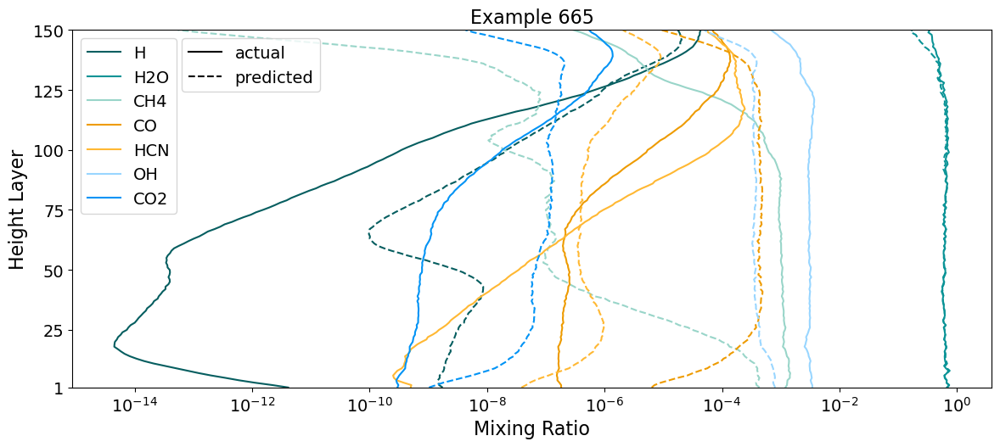

In [22]:
# bad examples: 103,
plot_example(x, x_pred, index=665)

In [23]:
def pred_plot_hist(x, x_pred, nbins=150, logscale=True, fax=None, norm_axis=None):
    x = x.flatten()
    x_pred = x_pred.flatten()

    xmin, xmax = np.min(x), np.max(x)

    if fax:
        f, ax = fax
    else:
        f, ax = plt.subplots(figsize=(5.5,5.5))

    ybins = np.logspace(np.log10(xmin), np.log10(xmax), nbins+1)
    xbins = ybins

    H_np, xedges, yedges = np.histogram2d(x, x_pred, bins=(xbins, ybins))

    if norm_axis is not None:
        if norm_axis == 0:
            print(f'{np.sum(H_np, axis=0) = }')
            div_array = np.tile(np.sum(H_np, axis=0)[None, ...], (nbins, 1))
        elif norm_axis == 1:
            div_array = np.tile(np.sum(H_np, axis=1)[..., None], (1, nbins))

        # print(f'{norm_axis = }')
        # print(f'{div_array.shape = }')
        # print(f'{div_array = }')
        H_np = H_np / div_array

    # get minimum value
    H_np_nans = np.where(H_np == 0, np.nan, H_np)
    H_min = np.nanmin(H_np_nans)

    imH = ax.pcolor(
        xedges,
        yedges,
        H_np.T,
        # cmap='gnuplot2',
        cmap='inferno',
        norm=SymLogNorm(linthresh=H_min) if logscale else None,
    )

    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(xmin, xmax)

    if not fax:
        ax.set_aspect('equal')

    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='3%', pad=0.05)
    cbar = f.colorbar(imH, cax=cax, orientation='vertical')
    cbar.set_label(
        'counts' if not norm_axis else 'fraction'
                   )

    if logscale:
        def y(x):
            return x

        x_line = [xmin, xmax]

        ax.plot(
            x_line,
            y(x_line),
            linestyle='--',
            c='white',
            alpha=0.75,
            label='perfect prediction'
        )

        ax.legend(loc='lower right', frameon=False, labelcolor='white')

    ax.set_xlabel('Actual mixing ratio')
    ax.set_ylabel('Predicted mixing ratio')

    ax.set_title(
        f'{core_name} prediction' if norm_axis is None else f"{core_name} prediction\nnormalized over axis {norm_axis}"
    )

    ax.text(
    x=0.02,
    y=0.95,
    color='white',
    s=f'bins = {nbins} x {nbins}',
    transform=ax.transAxes,
    alpha=0.5
        )

    # plt.tight_layout(h_pad=0, w_pad=0.1)
    if not fax:
        plt.savefig(
            f'{image_dir}{core_name}_hist.png' if norm_axis is None else f'{image_dir}{core_name}_hist_norm_axis_{norm_axis}.png',
            dpi=300,
        bbox_inches='tight')
        plt.show()



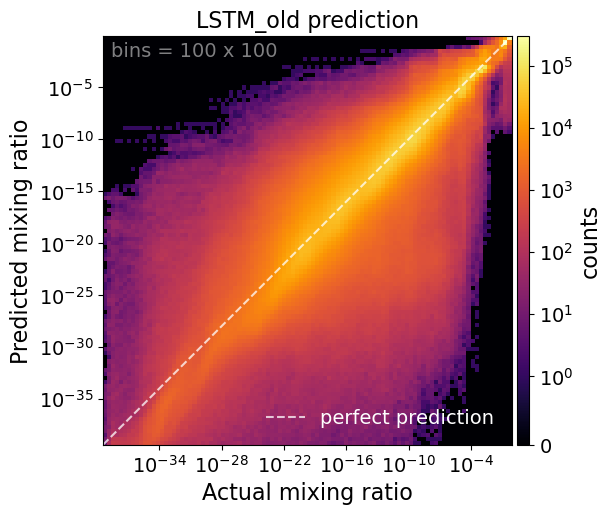

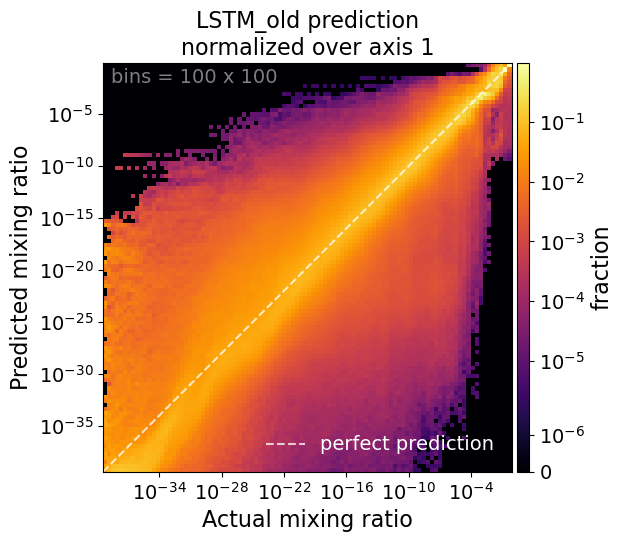

In [24]:
# pred_plot_hist(x, x_pred, nbins=150, logscale=False)
pred_plot_hist(x, x_pred, nbins=100, logscale=True)
pred_plot_hist(x, x_pred, nbins=100, logscale=True, norm_axis=1)
# pred_plot_hist(x, x_pred, nbins=150, logscale=True, norm_axis=1)

In [25]:
def pred_plot(x, x_pred, percentiles, nbins=150):

    x = x.flatten()
    x_pred = x_pred.flatten()

    xmin, xmax = np.min(x), np.max(x)

    f, ax = plt.subplots(figsize=(5.5,5.5))

    if percentiles:
        # bin data to calculate quantiles
        bins = np.logspace(np.log10(xmin), np.log10(xmax), nbins+1)

        centers = 0.5 * (bins[:-1] + bins[1:])

        q1 = []
        q2 = []
        q3 = []

        for i in tqdm(range(len(centers)), desc='calculating quantiles'):
            inner_edge = bins[i]
            outer_edge = bins[i+1]

            msk = (x > inner_edge) & (x < outer_edge)
            x_pred_msk = x_pred[msk]

            if len(x_pred_msk) > 0:
                q1.append(np.quantile(x_pred_msk, 0.05))
                q2.append(np.quantile(x_pred_msk, 0.50))
                q3.append(np.quantile(x_pred_msk, 0.95))
            else:
                q1.append(np.nan)
                q2.append(np.nan)
                q3.append(np.nan)


        ax.text(
            x=0.02,
            y=0.95,
            s=f'bins = {len(centers)}',
            transform=ax.transAxes,
            alpha=0.3
        )

        ax.fill_between(
            centers,
            q1,
            q3,
            # alpha=0.3,
            color=colors[-3],
            label='5 - 95 percentile'
        )

        ax.plot(
            centers,
            q2,
            color=colors[-2],
            label='median'
        )
    else:
        threshold = 500000
        if len(x) > threshold:
            x = x[:threshold]
        if len(x_pred) > threshold:
            x_pred = x_pred[:threshold]

        ax.scatter(
            x,
            x_pred,
            s=1,
            # marker='+',
            c=colors[4],
            alpha=1,
            label='predictions'
        )

    def y(x):
        return x

    x_line = [xmin, xmax]

    ax.plot(
        x_line,
        y(x_line),
        linestyle='--',
        c=colors[0],
        alpha=0.5,
        label='perfect prediction'
    )

    ax.set_xlim(xmin, xmax)
    ax.set_ylim(xmin, xmax)

    ax.set_xscale('log')
    ax.set_yscale('log')

    ax.set_aspect('equal')

    ax.legend(loc='lower right')

    ax.set_xlabel('Actual mixing ratio')
    ax.set_ylabel('Predicted mixing ratio')
    ax.set_title(f'{core_name} prediction')

    plt.tight_layout()
    plt.savefig(
        f'{image_dir}{core_name}.png' if not percentiles else f'{image_dir}{core_name}_percentiles.png',
        dpi=300)
    plt.show()

calculating quantiles: 100%|██████████| 100/100 [00:16<00:00,  6.08it/s]


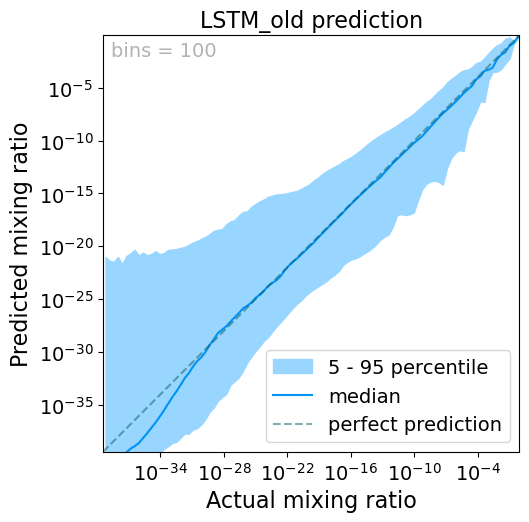

In [26]:
pred_plot(x, x_pred, percentiles=True, nbins=100)

In [27]:
# taken from:
# https://gist.github.com/artoby/0bcf790cfebed5805fbbb6a9853fe5d5
def symlogspace(col, n_cuts, dtype='float64'):
    """
    Splits a data range into log-like bins but with 0 and negative values
    taken into account. Log cuts start from the closest value to zero.

    Parameters
    ----------
    col: df column or array
    n_cuts: int
            Number of cuts to perform
    dtype: dtype of the outputs
    """
    min_val = col.min()
    max_val = col.max()

    # compute negative and positive range
    min_pos = col[col > 0].min() if not np.isnan(col[col > 0].min()) else 0
    max_neg = col[col < 0].max() if not np.isnan(col[col < 0].max()) else 0

    # neg_range = [-min_val, -max_neg] if min_val < max_neg else None
    neg_range = [max_val, max(min_val, min_pos)] if max_val > min_pos else None
    pos_range = [max(min_val, min_pos), max_val] if max_val > min_pos else None

    # If min value is 0 create a bin for it
    # zero_cut = [min_val] if max_neg <= min_val < min_pos else []
    zero_cut = [0]

    n_cuts = n_cuts - len(zero_cut)

    neg_range_size = (neg_range[0] - neg_range[1]) if neg_range is not None else 0
    pos_range_size = (pos_range[1] - pos_range[0]) if pos_range is not None else 0
    range_size = neg_range_size + pos_range_size

    n_pos_cuts = max(2, int(round(n_cuts * (pos_range_size / range_size)))) if range_size > 0 and pos_range_size > 0 else 0
    n_neg_cuts = n_pos_cuts
    # # Ensure each range has at least 2 edges if it's not empty
    # n_neg_cuts = max(2, n_cuts - n_pos_cuts) if pos_range_size > 0 else 0
    # # In case n_pos_cuts + n_neg_cuts > n_cuts this is needed
    # n_pos_cuts = max(2, n_cuts - n_neg_cuts) if pos_range_size > 0 else 0

    neg_cuts = []
    if n_neg_cuts > 0:
        neg_cuts = list(-np.geomspace(neg_range[0], neg_range[1], n_neg_cuts, dtype=dtype))

    pos_cuts = []
    if n_pos_cuts > 0:
        pos_cuts = list(np.geomspace(pos_range[0], pos_range[1], n_pos_cuts, dtype=dtype))

    result = neg_cuts + zero_cut + pos_cuts
    # Add 0.1% to the edges to include min and max
    result[0] = min(result[0] * 1.1, result[0] * 0.9)
    result[-1] = result[-1] * 1.1

    # calculate centers
    pos_centers = np.exp(0.5 * (np.log(pos_cuts[:-1]) + np.log(pos_cuts[1:])))
    neg_centers = - pos_centers[::-1]
    zero_centers = [-0.5 * pos_cuts[0], 0.5 * pos_cuts[0]]

    centers = np.concatenate([neg_centers, zero_centers, pos_centers])

    return result, centers

In [28]:
# from: https://stackoverflow.com/questions/21844024/weighted-percentile-using-numpy
def weighted_quantile(values, quantiles, sample_weight=None,
                      values_sorted=False, old_style=False):
    """ Very close to numpy.percentile, but supports weights.
    NOTE: quantiles should be in [0, 1]!
    :param values: numpy.array with data
    :param quantiles: array-like with many quantiles needed
    :param sample_weight: array-like of the same length as `array`
    :param values_sorted: bool, if True, then will avoid sorting of
        initial array
    :param old_style: if True, will correct output to be consistent
        with numpy.percentile.
    :return: numpy.array with computed quantiles.
    """
    values = np.array(values)
    quantiles = np.array(quantiles)
    if sample_weight is None:
        sample_weight = np.ones(len(values))
    sample_weight = np.array(sample_weight)
    assert np.all(quantiles >= 0) and np.all(quantiles <= 1), \
        'quantiles should be in [0, 1]'

    if not values_sorted:
        sorter = np.argsort(values)
        values = values[sorter]
        sample_weight = sample_weight[sorter]

    weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
    if old_style:
        # To be convenient with numpy.percentile
        weighted_quantiles -= weighted_quantiles[0]
        weighted_quantiles /= weighted_quantiles[-1]
    else:
        weighted_quantiles /= np.sum(sample_weight)
    return np.interp(quantiles, weighted_quantiles, values)


def error_hist(x, x_pred, nbins=150, plot_quantiles=False, log=True, log_error=True):
    f, ax = plt.subplots(figsize=(7, 5.5))

    x = x.flatten()
    x_pred = x_pred.flatten()

    if log_error:
        x_e = np.log10(x_pred) - np.log10(x)
    else:
        x_e = np.abs(x_pred - x)

    # extent = plot_params['hist_extent']
    extent = np.max(np.abs(x_e))
    datamin = -extent
    datamax = extent

    if log_error:
        mybins = np.linspace(datamin, datamax, nbins+1)
        centers = 0.5 * (mybins[:-1] + mybins[1:])
    else:
        # mybins, centers = symlogspace(x_e, nbins+1)
        mybins = np.logspace(np.log10(x_e.min()), np.log10(x_e.max()), nbins+1)
        centers = np.exp(0.5 * (np.log(mybins[:-1]) + np.log(mybins[1:])))

    myhist, _ = np.histogram(x_e, bins=mybins)

    ax.bar(
        # centers,
        mybins[:-1],
        # log_hist,
        myhist,
        width=1.0 * (datamax - datamin) / nbins if log_error else np.diff(np.abs(mybins)),
        align='edge',
        color=colors[-5]
    )

    if log:
        ax.set_yscale('log')

    if not log_error:
        # ax.set_xscale('symlog', linthresh=np.min(np.abs(centers)))
        ax.set_xscale('log')
        # pass
    ymin, ymax = ax.get_ylim()


    if plot_quantiles:
        qax = ax

        quantiles = weighted_quantile(
        centers,
        [0.05, 0.5, 0.95],
        myhist
    )

        qax.axvline(
            quantiles[1],
            label=f'median: {quantiles[1]:.2f}',
            color=colors[-1],
            # linewidth=1,
            # linestyle='dotted'
        )

        qax.axvline(
            quantiles[0],
            linestyle='--',
            label=f'5 perc.: {quantiles[0]:.2f}',
            color=colors[-1],
            # linewidth=1,
        )

        qax.axvline(
            quantiles[2],
            linestyle='--',
            label=f'95 perc.: {quantiles[2]:.2f}',
            color=colors[-1],
            # linewidth=1,
        )

        qax.legend(loc='upper right')

    ax.text(
        x=0.02,
        y=0.95,
        s=f'bins = {len(centers)}',
        transform=ax.transAxes,
        alpha=0.3
    )

    # ax.set_xlim(datamin, datamax)
    ax.set_ylim(ymin, ymax)

    if log_error:
        ax.set_xlabel('$\log_{10}$(prediction) - $\log_{10}$(actual)')
    else:
        ax.set_xlabel('log10(prediction - actual)')

    ax.set_ylabel('counts')
    ax.set_title(f'{core_name} prediction error')

    save_name = ''
    if log:
        save_name += 'logscale_'
    if log_error:
        save_name += 'log_'

    plt.tight_layout()
    plt.savefig(
        f'{image_dir}{core_name}_{save_name}error.png',
        dpi=300)
    plt.show()

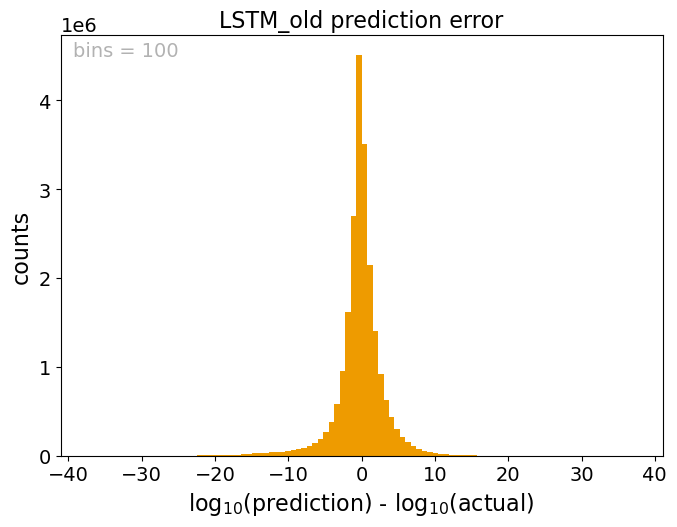

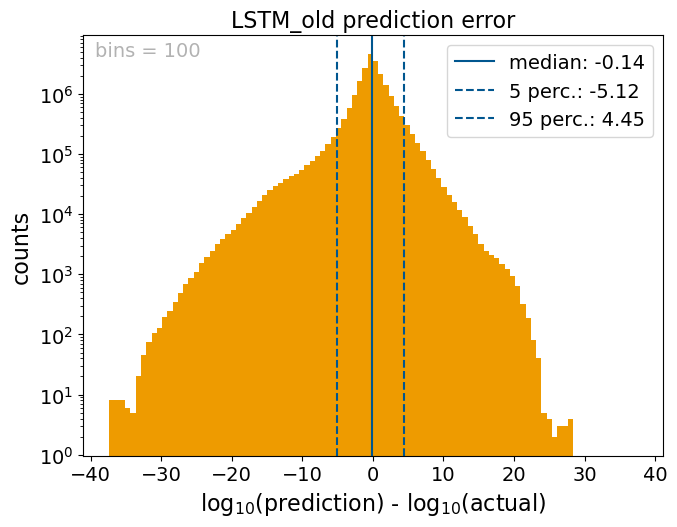

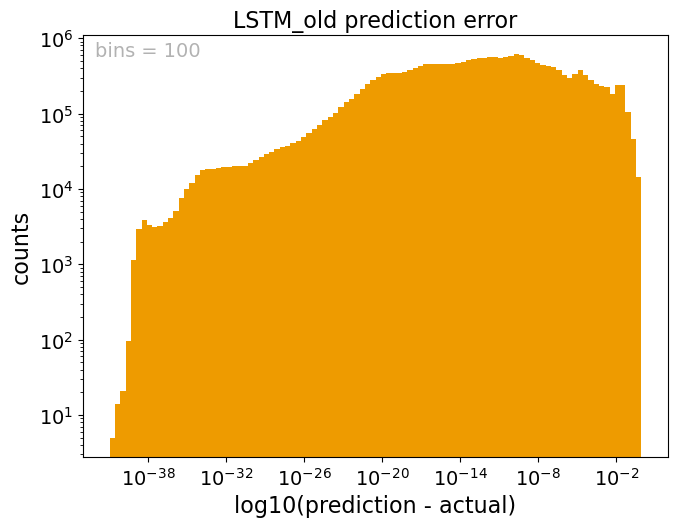

In [29]:
error_hist(
    x,
    x_pred,
    nbins=100,
    plot_quantiles=False,
    log=False,
    log_error=True
)

error_hist(
    x,
    x_pred,
    nbins=100,
    plot_quantiles=True,
    log=True,
        log_error=True
)

error_hist(
    x,
    x_pred,
    nbins=100,
    plot_quantiles=False,
    log=True,
    log_error=False
)

In [111]:

def dist_plot_2d(x, x_pred, nbins=100, fig_spec_r=None, spec_name=None):

    if not fig_spec_r:
        fig = plt.figure(figsize=(22, 5.5))
        spec = gridspec.GridSpec(1, 4, figure=fig)
        row = 0
    else:
        fig, spec, row = fig_spec_r

    # calculate points
    x_coords = np.zeros(x.shape[1] * x.shape[0])
    y_coords = np.zeros(x.shape[1] * x.shape[0])

    x_pred_coords = np.zeros(x.shape[1] * x.shape[0])
    y_pred_coords = np.zeros(x.shape[1] * x.shape[0])

    x_error_coords = np.zeros(x.shape[1] * x.shape[0])
    y_error_coords = np.zeros(x.shape[1] * x.shape[0])

    x_log_error_coords = np.zeros(x.shape[1] * x.shape[0])
    y_log_error_coords = np.zeros(x.shape[1] * x.shape[0])

    for i_0 in tqdm(range(x.shape[0])):
        for i_1 in range(x.shape[1]):
            x_coords[i_0 * x.shape[1] + i_1] = i_0 + 1
            y_coords[i_0 * x.shape[1] + i_1] = x[i_0, i_1]

            x_pred_coords[i_0 * x.shape[1] + i_1] = i_0 + 1
            y_pred_coords[i_0 * x.shape[1] + i_1] = x_pred[i_0, i_1]

            x_error_coords[i_0 * x.shape[1] + i_1] = i_0 + 1
            y_error_coords[i_0 * x.shape[1] + i_1] = x_pred[i_0, i_1] - x[i_0, i_1]

            x_log_error_coords[i_0 * x.shape[1] + i_1] = i_0 + 1
            y_log_error_coords[i_0 * x.shape[1] + i_1] = np.log10(x_pred[i_0, i_1]) - np.log10(x[i_0, i_1])

    def plot_single_hist(x_c, y_c, ax, error=False, error_log=False):
        xmin, xmax = np.min(x_coords), np.max(x_coords)

        if error:
            if error_log:
                y_close_zero = np.abs(y_c).min()
                ybins, ycenters = symlogspace(y_c, nbins+1)
            else:
                ybins = np.linspace(y_c.min(), y_c.max(), nbins+1)

        else:
            ymin, ymax = np.min(y_coords), np.max(y_coords)
            ybins = np.logspace(np.log10(ymin), np.log10(ymax), nbins+1)


        xbins = np.linspace(xmin - 0.5, xmax + 0.5, x.shape[0] + 1)

        H_np, xedges, yedges = np.histogram2d(x_c, y_c, bins=(xbins, ybins))

        # get minimum value
        H_np_nans = np.where(H_np == 0, np.nan, H_np)
        H_min = np.nanmin(H_np_nans)

        imH = ax.pcolor(
            xedges,
            yedges,
            H_np.T,
            # cmap='gnuplot2',
            cmap='inferno',
            norm=SymLogNorm(linthresh=H_min),
        )

        if error:
            if error_log:
                ax.set_yscale('symlog', linthresh=y_close_zero)
            else:
                ax.set_yscale('linear')
        else:
            ax.set_yscale('log')

        divider = make_axes_locatable(ax)
        cax = divider.append_axes('right', size='3%', pad=0.05)
        cbar = fig.colorbar(imH, cax=cax, orientation='vertical')
        cbar.set_label('counts')

        return (H_np, xedges, yedges)

    # actual
    # f, ax = plt.subplots(figsize=(5,5))
    ax1 = fig.add_subplot(spec[row, 0])
    _ =  plot_single_hist(x_coords, y_coords, ax1)

    ax1.set_xlabel("Height Layer")
    ax1.set_ylabel("Mixing Ratio")
    ax1.set_title(
        f"{spec_name}\nActual Mixing Ratio distribution" if spec_name else "Actual Mixing Ratio distribution"
        , y=1.04)

    # predicted
    # f, ax = plt.subplots(figsize=(5,5))
    ax2 = fig.add_subplot(spec[row, 1])
    _ =  plot_single_hist(x_pred_coords, y_pred_coords, ax2)

    ax2.set_xlabel('Height layer')
    ax2.set_ylabel('Mixing Ratio')
    ax2.set_title(
        f"{spec_name}\nPredicted Mixing Ratio distribution" if spec_name else "Predicted Mixing Ratio distribution",
        y=1.04)

    # log error
    # f, ax = plt.subplots(figsize=(5,5))
    ax3 = fig.add_subplot(spec[row, 2])
    _ =  plot_single_hist(x_log_error_coords, y_log_error_coords, ax3, error=True)

    ax3.set_xlabel('Height layer')
    ax3.set_ylabel('log(Mixing Ratio)')
    ax3.set_title(
        f"{spec_name}\nlog(Predicted) - log(Actual) Mixing Ratio distribution" if spec_name else "log(Predicted) - log(Actual) Mixing Ratio distribution",
        y=1.04)

    # ax4 = fig.add_subplot(spec[row, 3])
    # _ =  plot_single_hist(x_log_error_coords, y_log_error_coords, ax4, error=True, error_log=True)
    #
    # ax4.set_xlabel('Height layer')
    # ax4.set_ylabel('log(Mixing Ratio)')
    # ax4.set_title(
    #     f"{spec_name}\nlog(Predicted) - log(Actual) Mixing Ratio distribution" if spec_name else "log(Predicted) - log(Actual) Mixing Ratio distribution",
    #     y=1.04)

    ax4 = fig.add_subplot(spec[row, 3])
    pred_plot_hist(x, x_pred, nbins=150, logscale=True, fax=(fig, ax4), norm_axis=None)

    ax4.set_title(
        f"{spec_name}\n{core_name} prediction" if spec_name else f"{core_name} prediction",
        y=1.04)

    plt.tight_layout()

    if spec_name:
        individual_dir = f'{image_dir}{core_name}_individual_distributions/'
        if not os.path.isdir(individual_dir):
            os.mkdir(individual_dir)

    plt.savefig(
        f'{individual_dir}{spec_name}.png' if spec_name else f'{image_dir}{core_name}_distributions.png',
        dpi=300)
    plt.show()


100%|██████████| 150/150 [00:55<00:00,  2.71it/s]


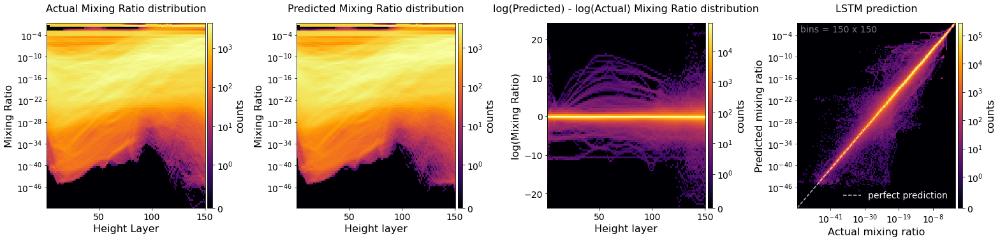

In [112]:
dist_plot_2d(
    x.reshape(150, 69*x.shape[-1]),
    x_pred.reshape(150, 69*x.shape[-1]),
    nbins=100
)

H2


100%|██████████| 150/150 [00:00<00:00, 175.05it/s]


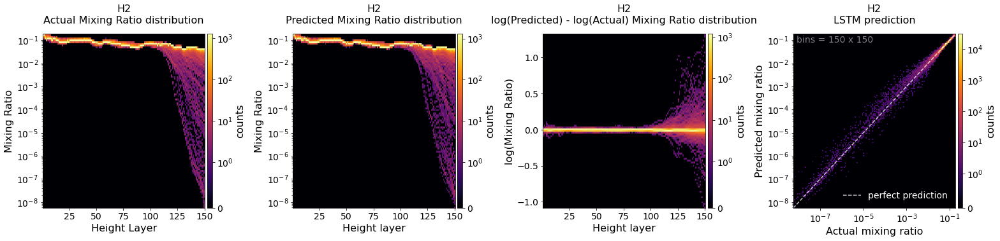

He


100%|██████████| 150/150 [00:00<00:00, 194.02it/s]


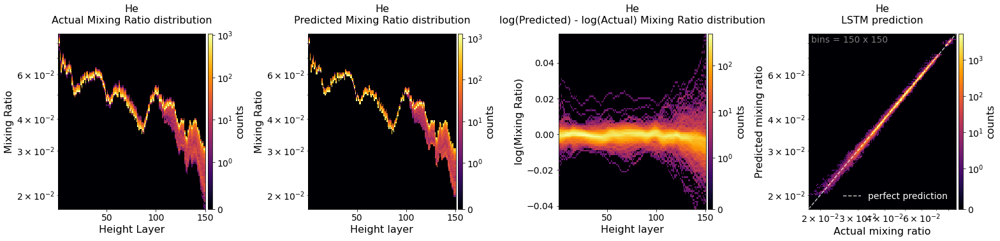

H


100%|██████████| 150/150 [00:00<00:00, 216.66it/s]


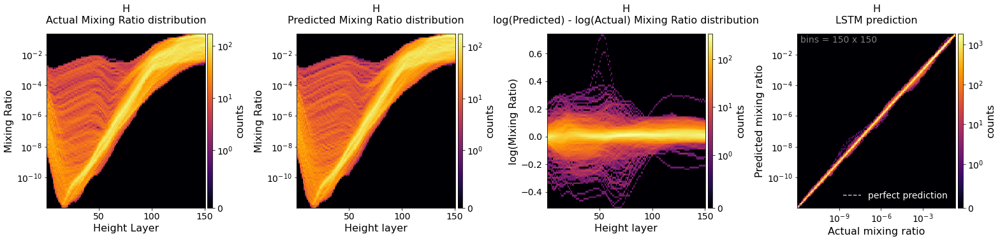

H2O


100%|██████████| 150/150 [00:00<00:00, 204.60it/s]


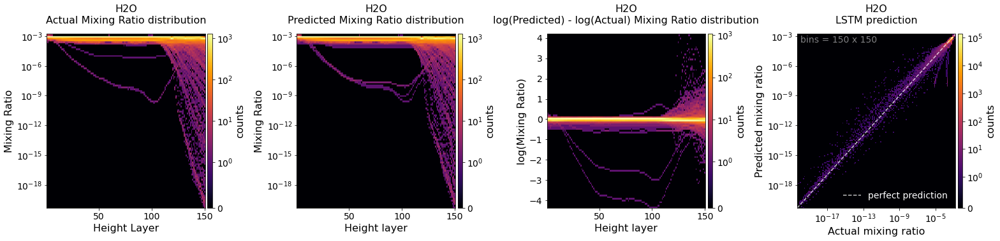

CH4


100%|██████████| 150/150 [00:00<00:00, 195.74it/s]


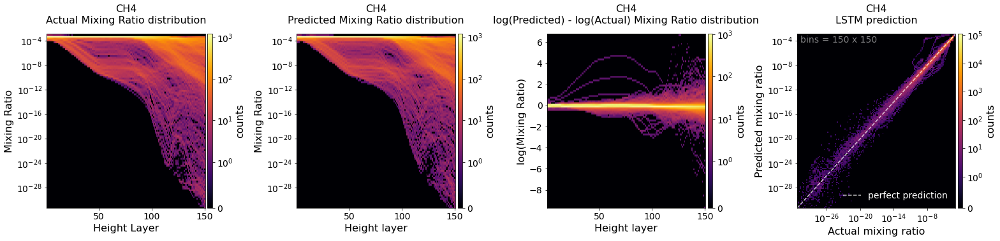

CO


100%|██████████| 150/150 [00:00<00:00, 206.30it/s]


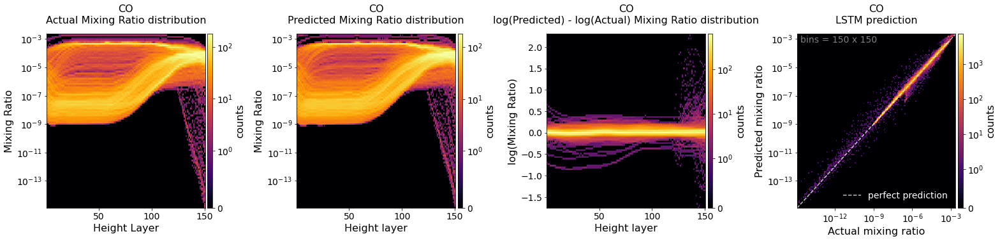

NH3


100%|██████████| 150/150 [00:00<00:00, 180.99it/s]


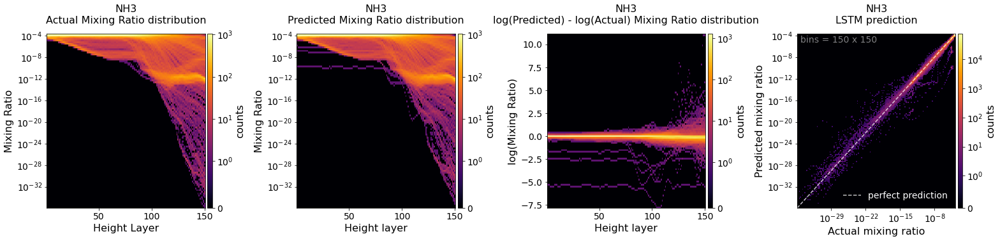

HCN


100%|██████████| 150/150 [00:00<00:00, 205.85it/s]


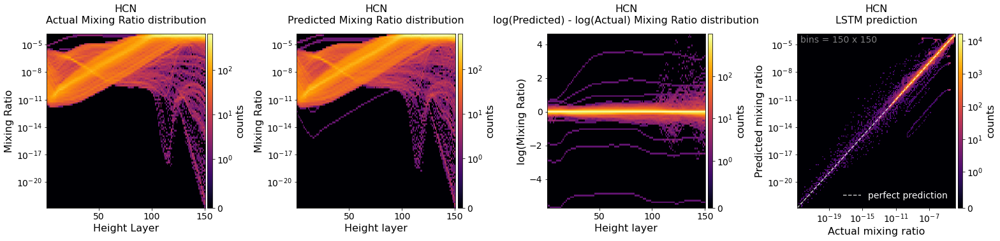

N2


100%|██████████| 150/150 [00:00<00:00, 179.81it/s]


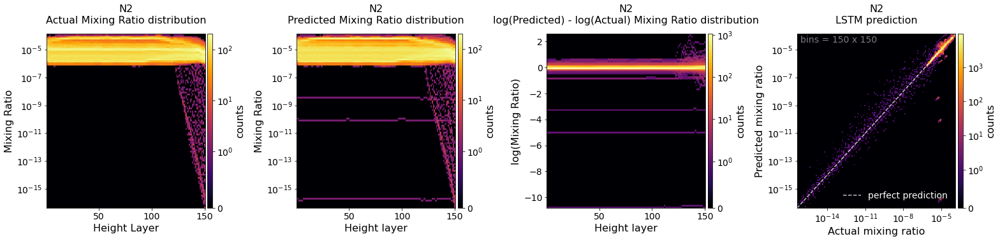

C2H2


100%|██████████| 150/150 [00:00<00:00, 203.77it/s]


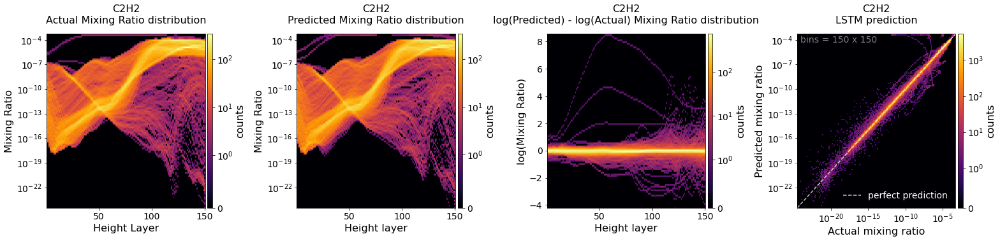

O


100%|██████████| 150/150 [00:00<00:00, 203.41it/s]


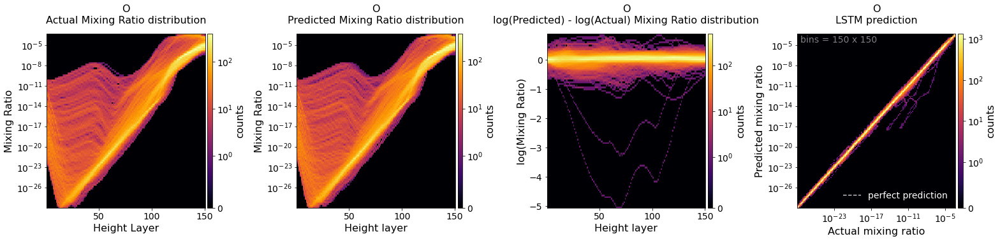

CH3


100%|██████████| 150/150 [00:00<00:00, 202.37it/s]


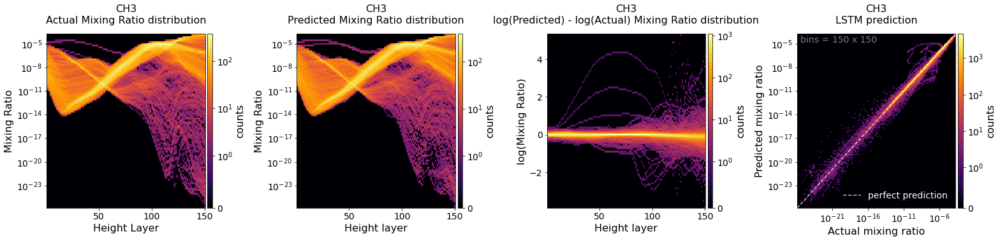

C3H2


100%|██████████| 150/150 [00:00<00:00, 202.26it/s]


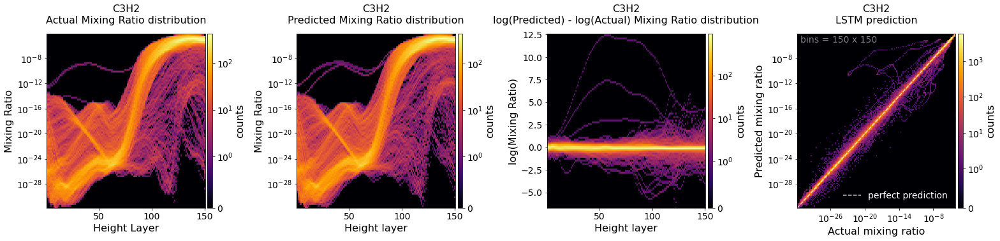

C3H3


100%|██████████| 150/150 [00:00<00:00, 206.03it/s]


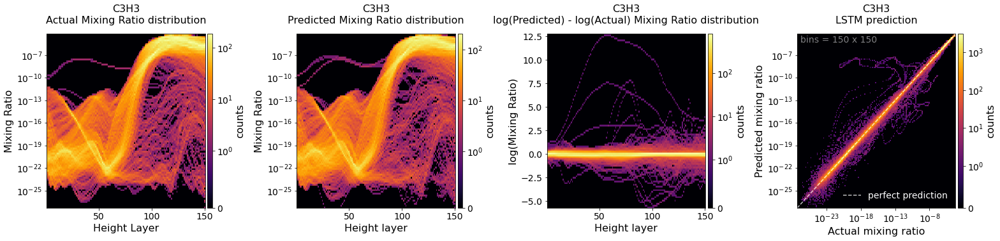

C


100%|██████████| 150/150 [00:00<00:00, 221.43it/s]


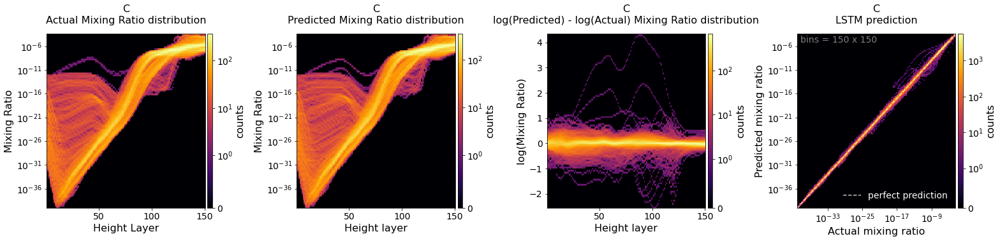

OH


100%|██████████| 150/150 [00:00<00:00, 218.09it/s]


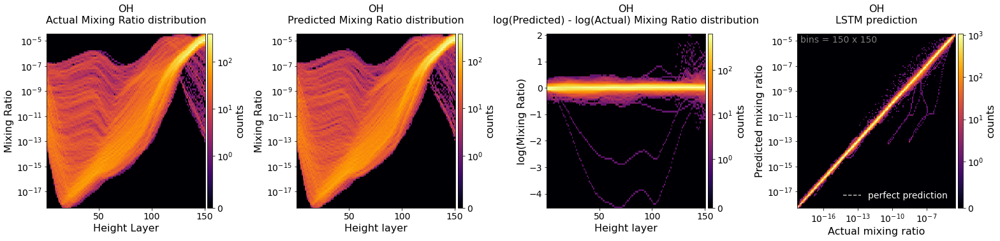

C6H6


100%|██████████| 150/150 [00:00<00:00, 198.73it/s]


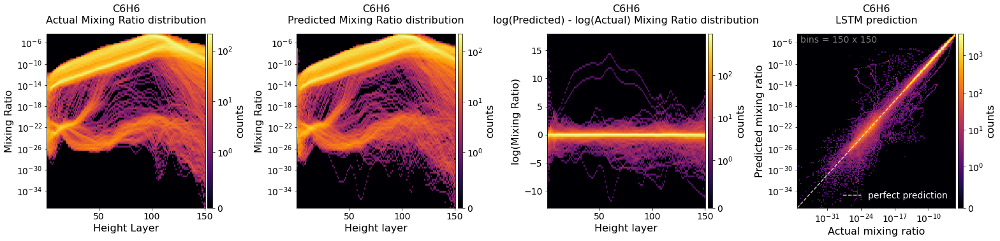

C3H4


100%|██████████| 150/150 [00:00<00:00, 204.81it/s]


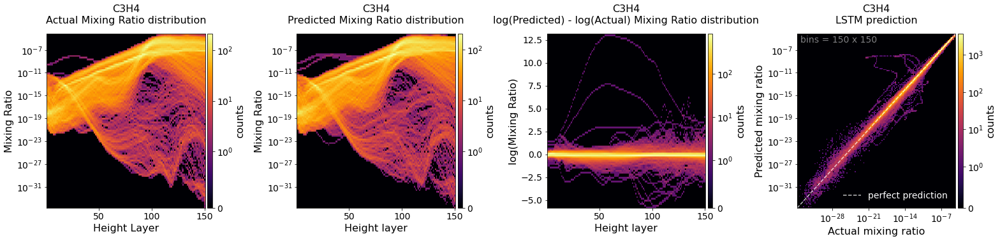

NH2


100%|██████████| 150/150 [00:00<00:00, 181.99it/s]


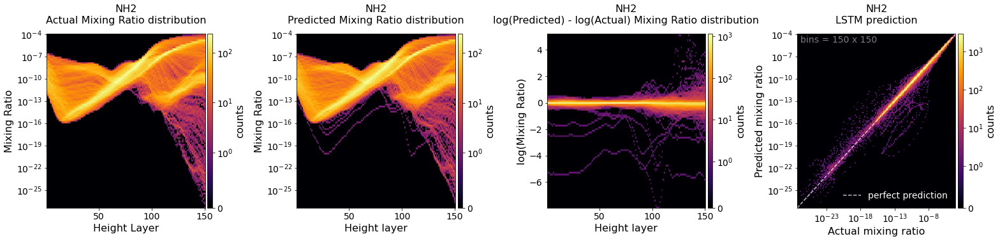

N


100%|██████████| 150/150 [00:00<00:00, 187.17it/s]


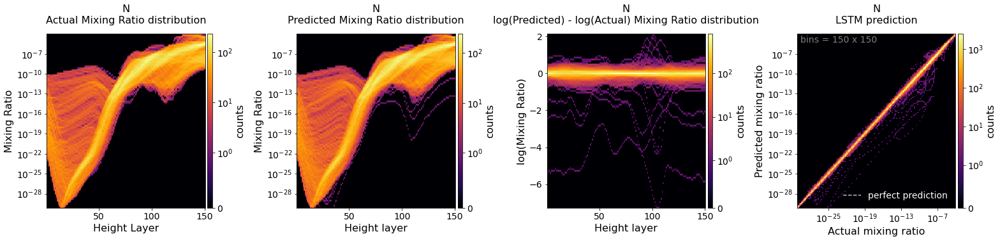

HC3N


100%|██████████| 150/150 [00:00<00:00, 167.22it/s]


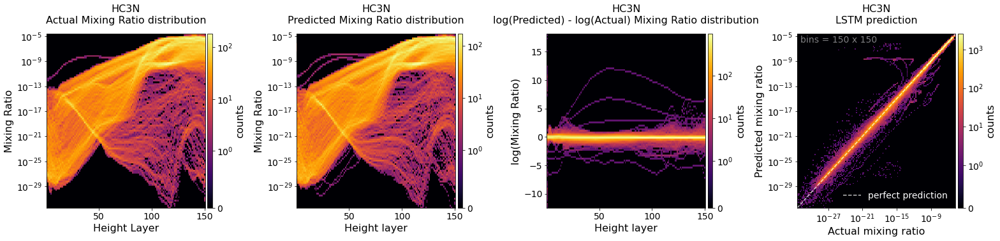

CO2


100%|██████████| 150/150 [00:00<00:00, 216.24it/s]


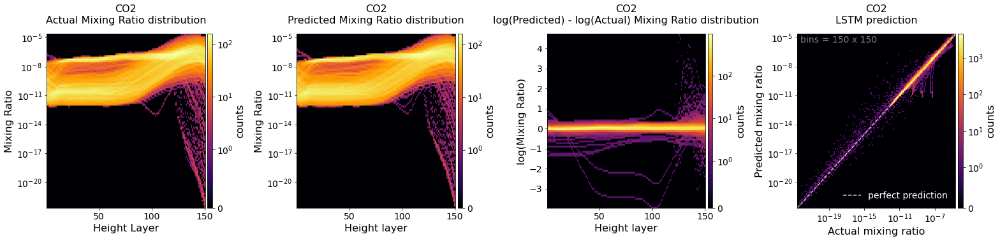

C2H4


100%|██████████| 150/150 [00:00<00:00, 192.12it/s]


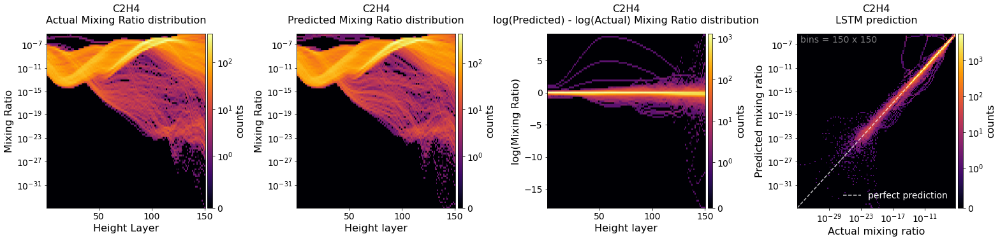

O2


100%|██████████| 150/150 [00:00<00:00, 203.27it/s]


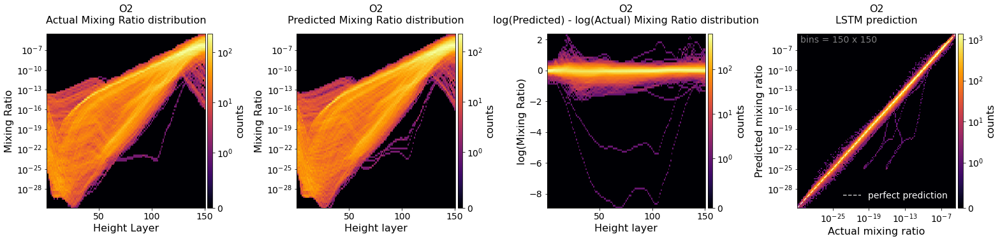

NO


100%|██████████| 150/150 [00:00<00:00, 201.51it/s]


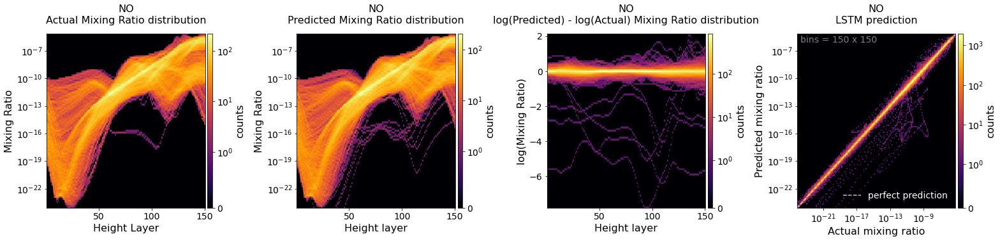

C4H2


100%|██████████| 150/150 [00:00<00:00, 180.40it/s]


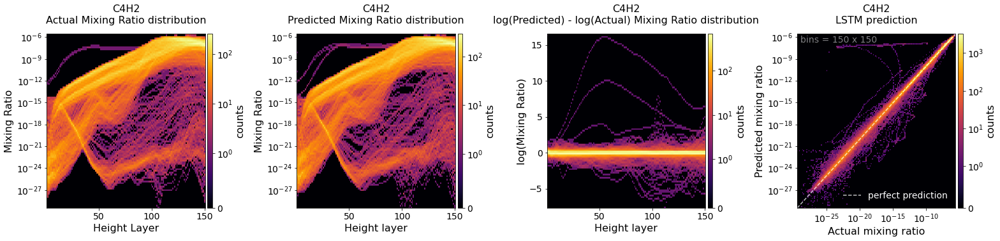

C2H6


100%|██████████| 150/150 [00:00<00:00, 202.47it/s]


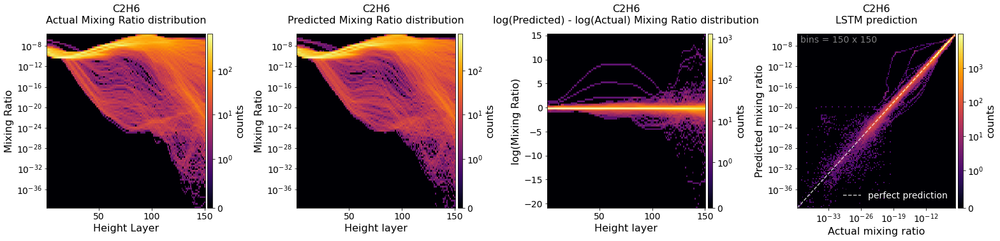

C6H5


100%|██████████| 150/150 [00:00<00:00, 214.85it/s]


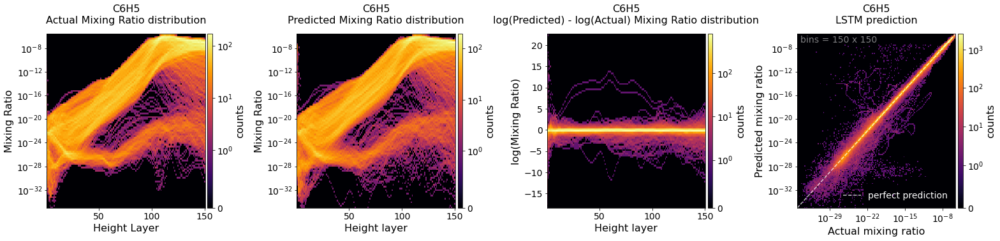

C4H3


100%|██████████| 150/150 [00:00<00:00, 217.66it/s]


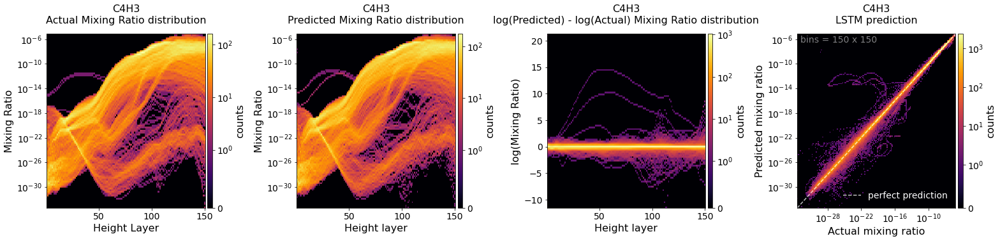

H2CO


100%|██████████| 150/150 [00:00<00:00, 183.18it/s]


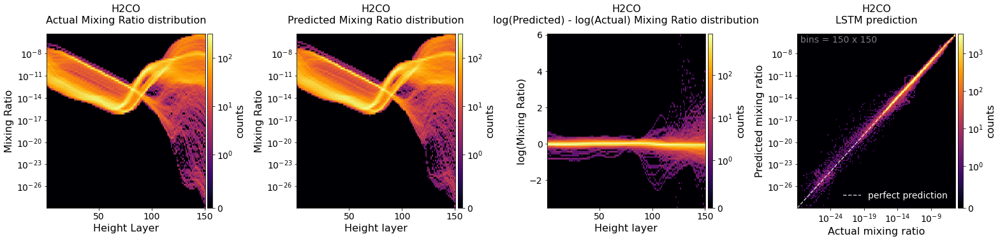

CN


100%|██████████| 150/150 [00:00<00:00, 183.42it/s]


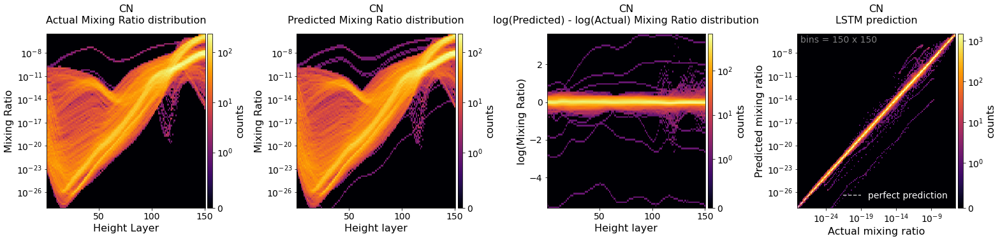

CH2


100%|██████████| 150/150 [00:00<00:00, 204.94it/s]


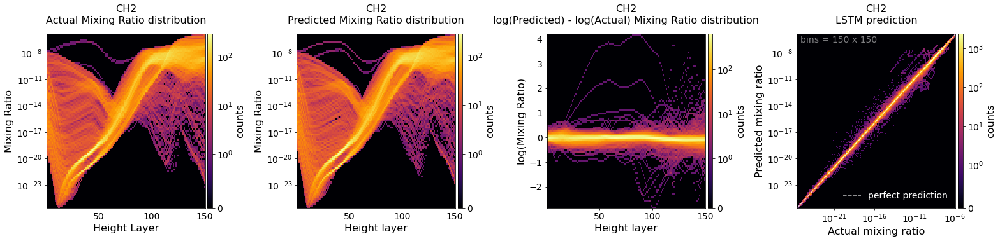

CH2CN


100%|██████████| 150/150 [00:00<00:00, 170.05it/s]


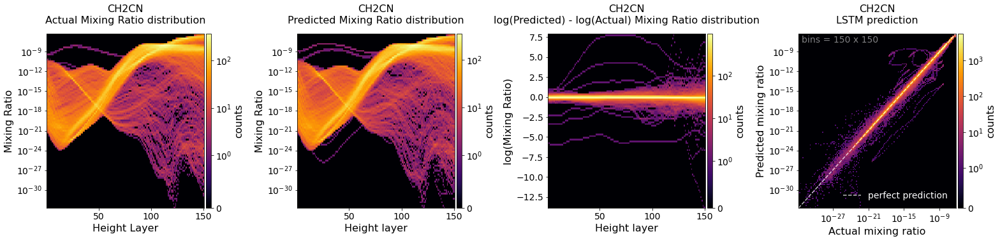

NH


100%|██████████| 150/150 [00:00<00:00, 182.58it/s]


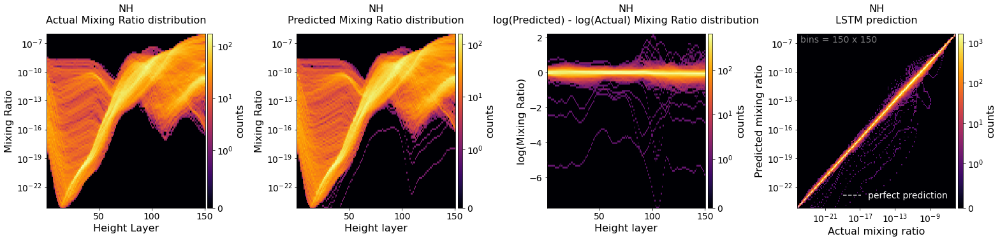

C2H


100%|██████████| 150/150 [00:00<00:00, 178.25it/s]


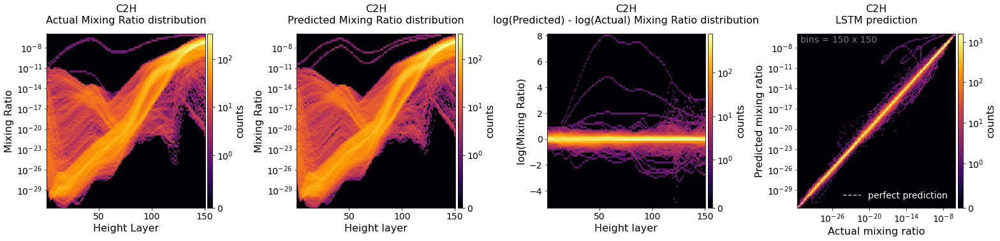

CH


100%|██████████| 150/150 [00:00<00:00, 182.12it/s]


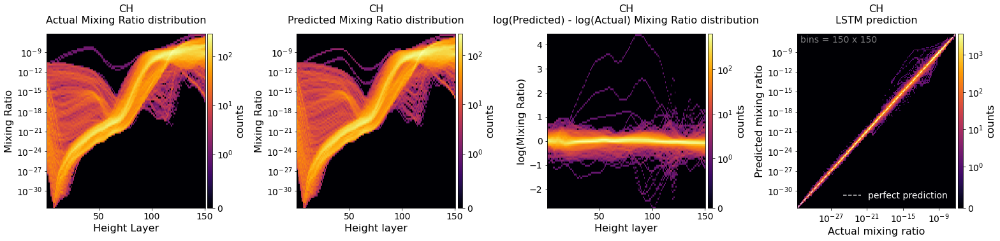

NCO


100%|██████████| 150/150 [00:00<00:00, 217.18it/s]


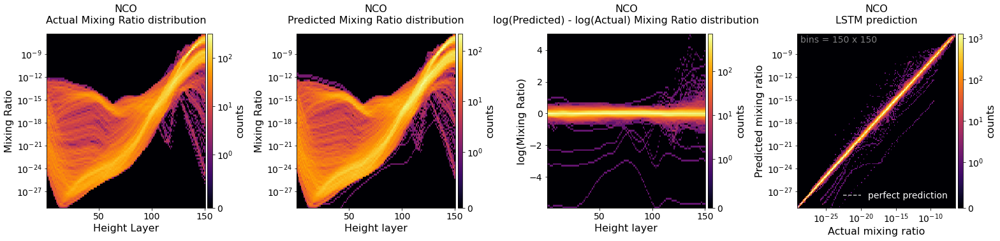

C2H3CN


100%|██████████| 150/150 [00:00<00:00, 206.56it/s]


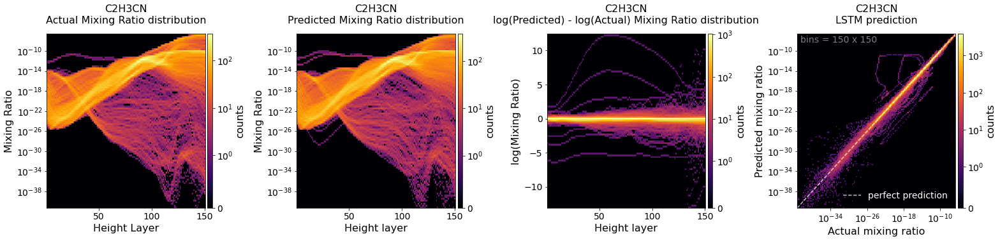

H2CN


100%|██████████| 150/150 [00:00<00:00, 181.63it/s]


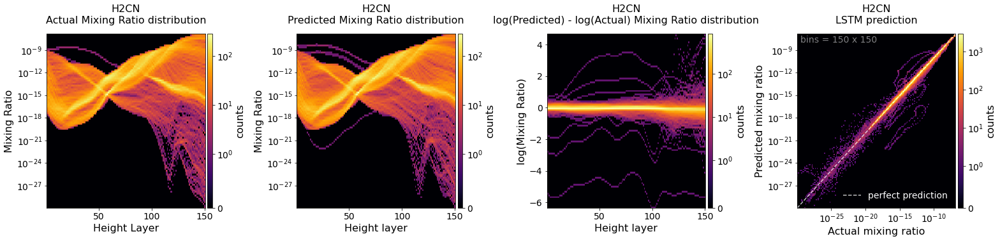

HNCO


100%|██████████| 150/150 [00:00<00:00, 181.96it/s]


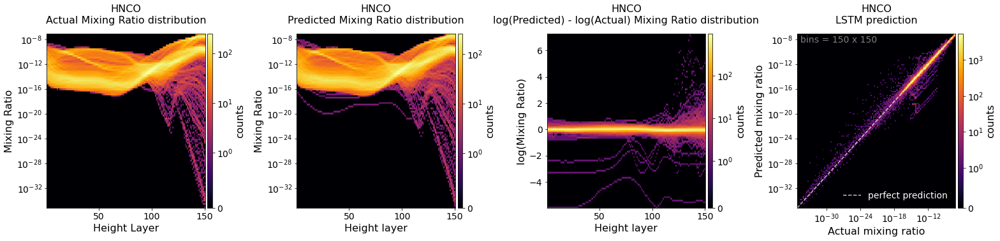

C2H3


100%|██████████| 150/150 [00:00<00:00, 205.95it/s]


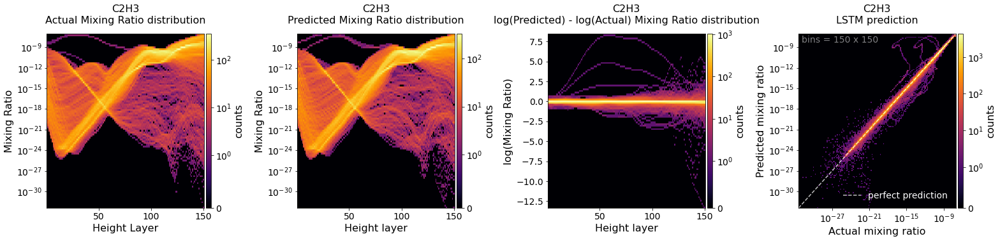

HNO


100%|██████████| 150/150 [00:00<00:00, 182.24it/s]


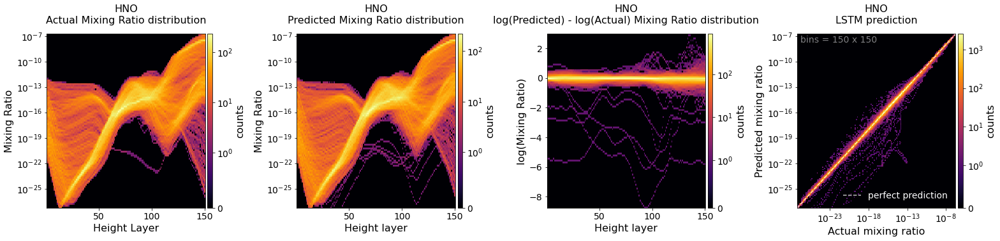

N2O


100%|██████████| 150/150 [00:00<00:00, 169.72it/s]


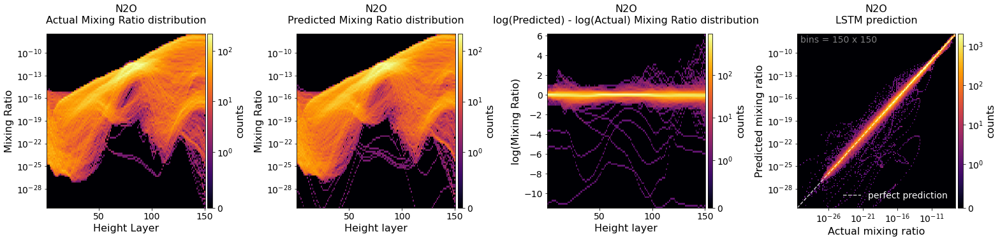

N2H2


100%|██████████| 150/150 [00:00<00:00, 216.25it/s]


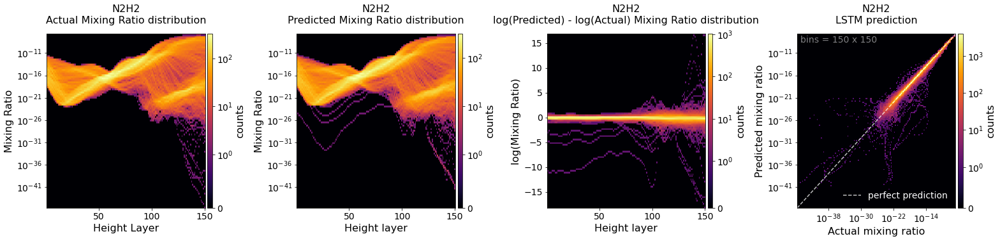

HCO


100%|██████████| 150/150 [00:00<00:00, 181.57it/s]


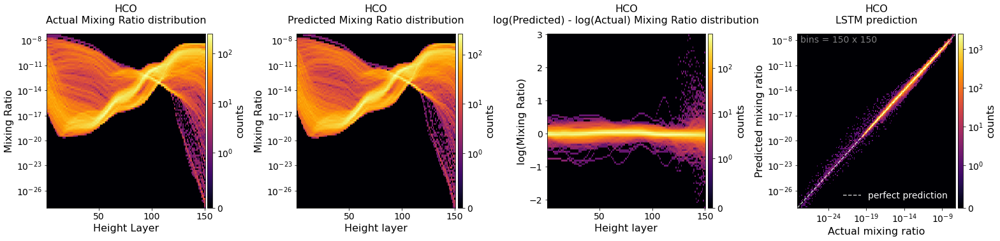

CH2NH


100%|██████████| 150/150 [00:00<00:00, 219.04it/s]


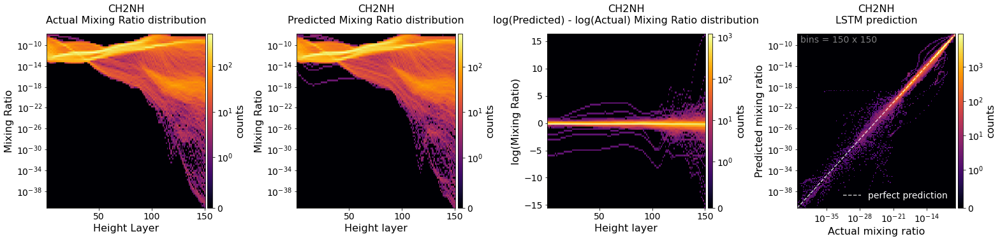

CH3NH2


100%|██████████| 150/150 [00:00<00:00, 180.62it/s]


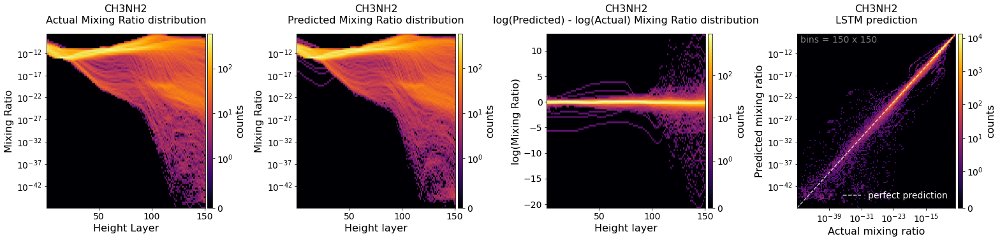

O_1


100%|██████████| 150/150 [00:00<00:00, 218.53it/s]


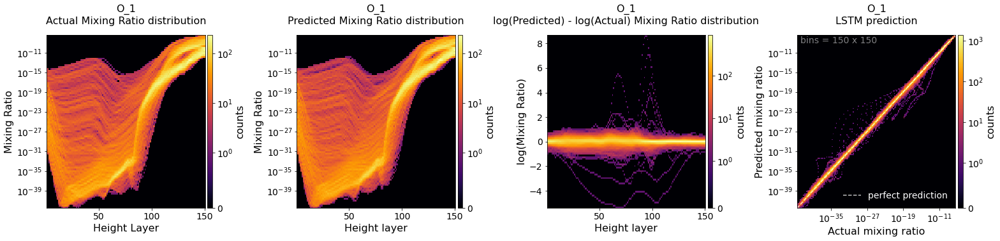

C2


100%|██████████| 150/150 [00:00<00:00, 180.68it/s]


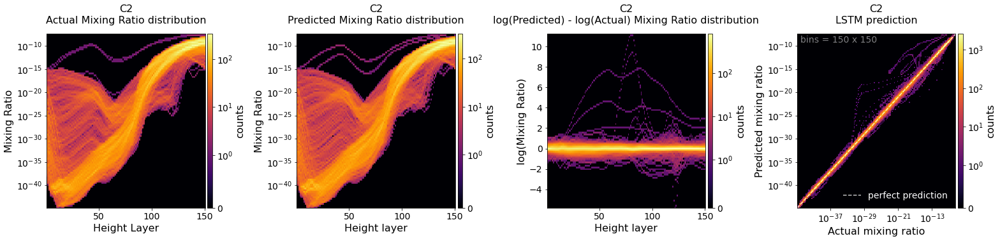

CH2_1


100%|██████████| 150/150 [00:00<00:00, 170.15it/s]


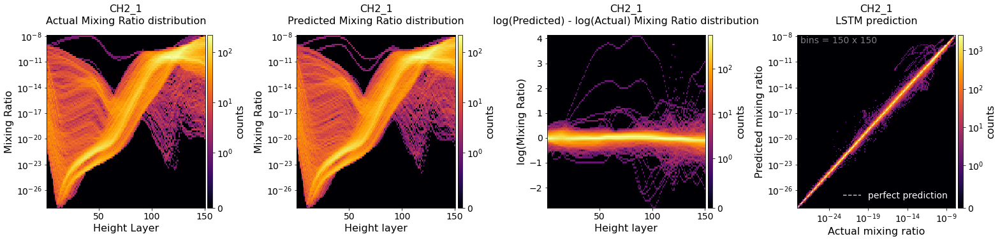

N_2D


100%|██████████| 150/150 [00:00<00:00, 171.93it/s]


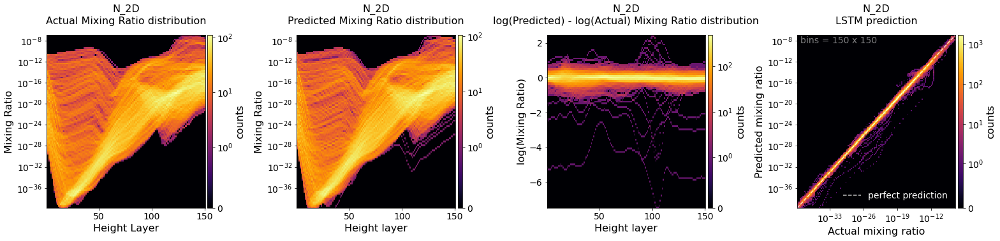

CH3CN


100%|██████████| 150/150 [00:00<00:00, 162.63it/s]


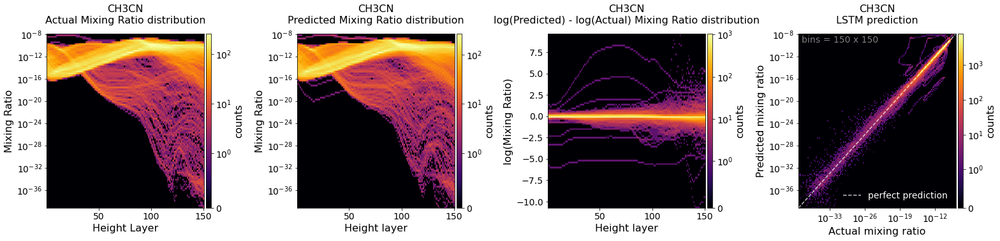

C2H5


100%|██████████| 150/150 [00:00<00:00, 173.17it/s]


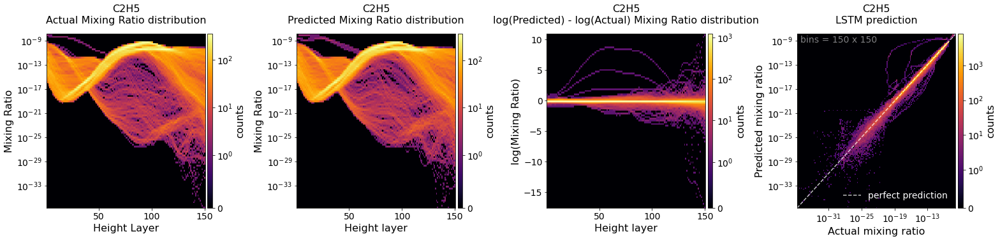

H2CCO


100%|██████████| 150/150 [00:00<00:00, 170.22it/s]


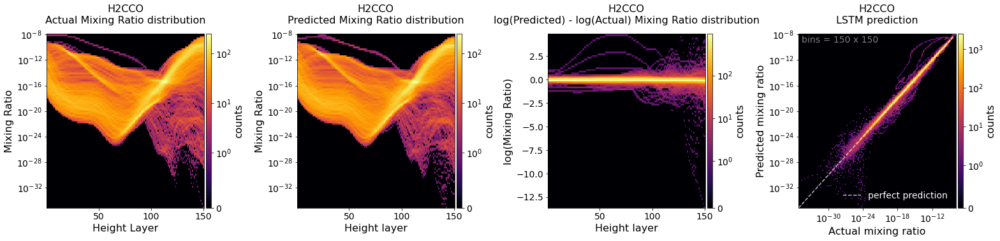

CH3OH


100%|██████████| 150/150 [00:00<00:00, 169.77it/s]


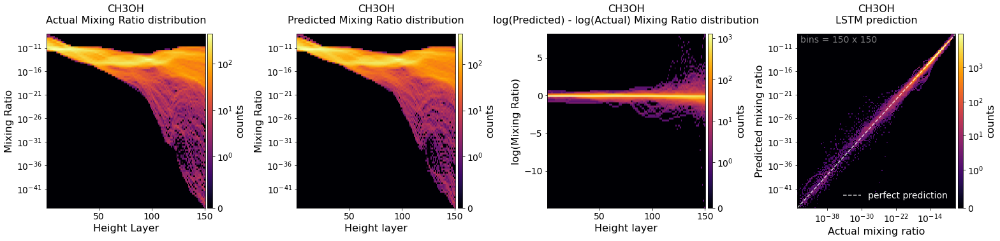

N2H


100%|██████████| 150/150 [00:00<00:00, 168.76it/s]


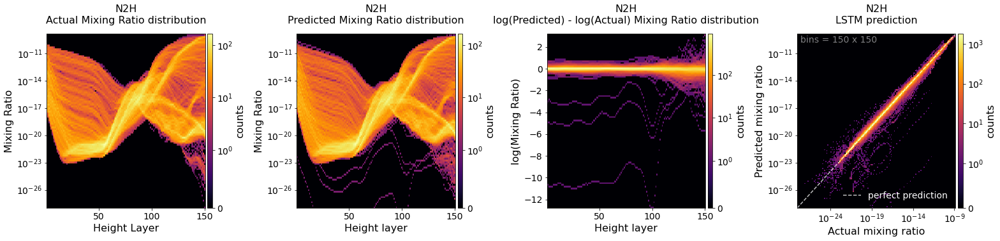

CH2OH


100%|██████████| 150/150 [00:00<00:00, 170.62it/s]


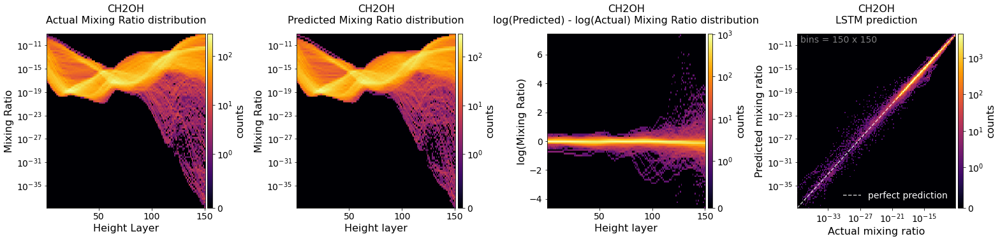

C4H5


100%|██████████| 150/150 [00:00<00:00, 170.95it/s]


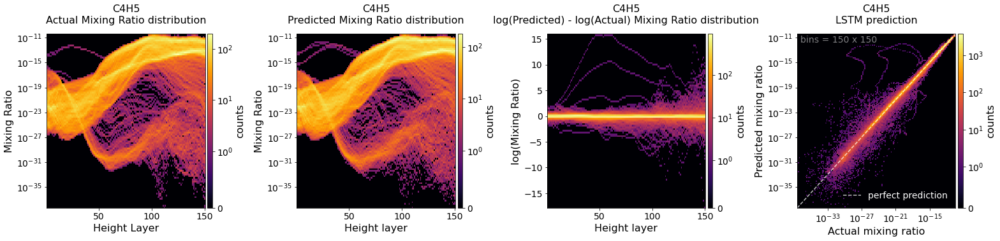

HCCO


100%|██████████| 150/150 [00:00<00:00, 181.92it/s]


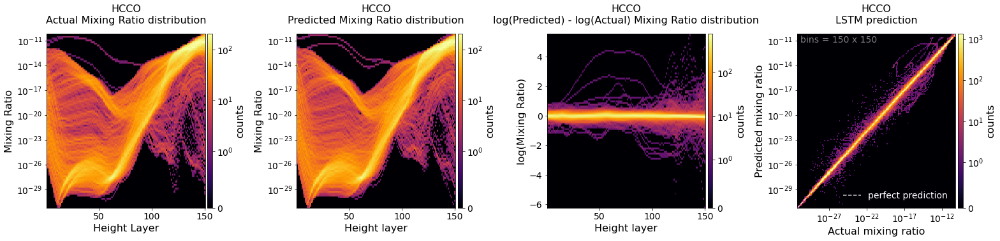

CH2NH2


100%|██████████| 150/150 [00:00<00:00, 167.52it/s]


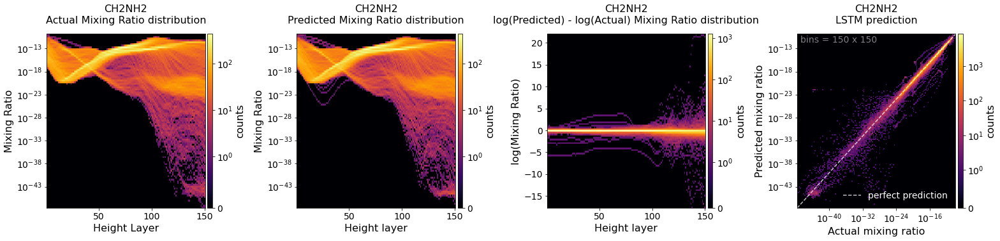

N2H4


100%|██████████| 150/150 [00:00<00:00, 174.58it/s]


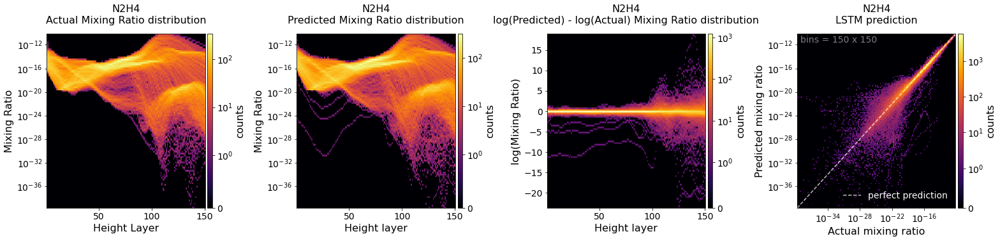

CH3CHO


100%|██████████| 150/150 [00:00<00:00, 173.75it/s]


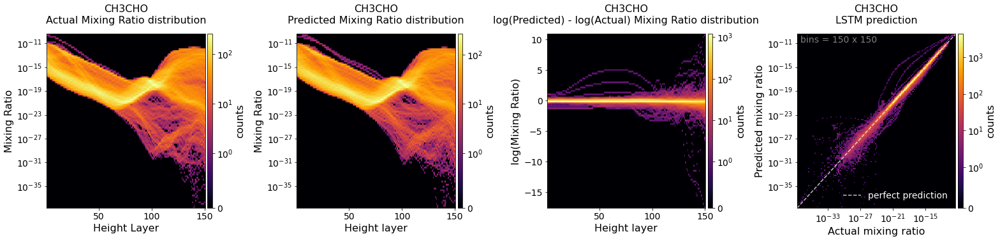

CH3O


100%|██████████| 150/150 [00:00<00:00, 174.02it/s]


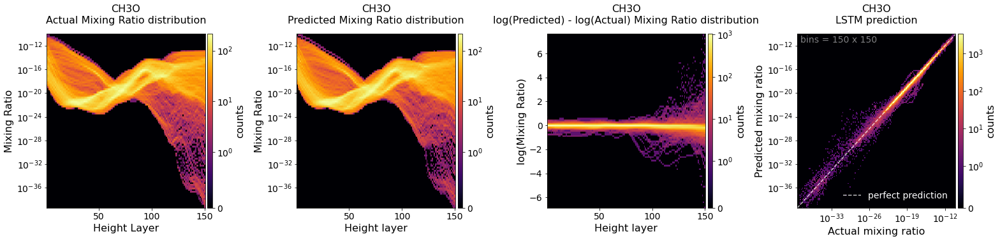

N2H3


100%|██████████| 150/150 [00:00<00:00, 183.02it/s]


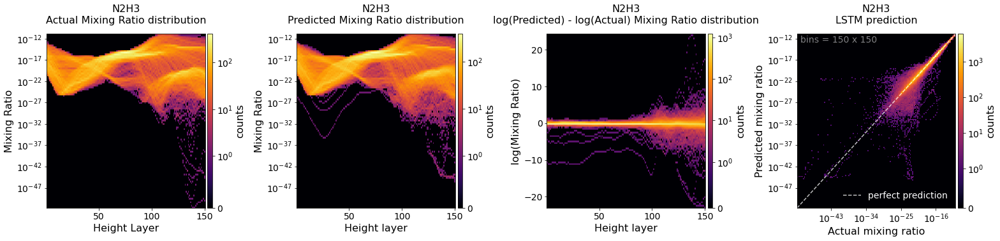

CH3CO


100%|██████████| 150/150 [00:00<00:00, 168.71it/s]


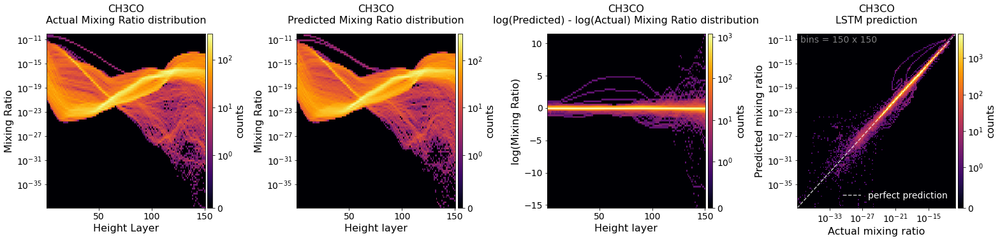

HO2


100%|██████████| 150/150 [00:00<00:00, 196.96it/s]


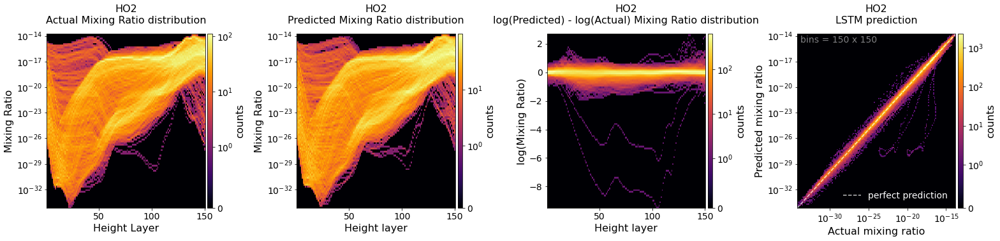

HNO2


100%|██████████| 150/150 [00:00<00:00, 202.58it/s]


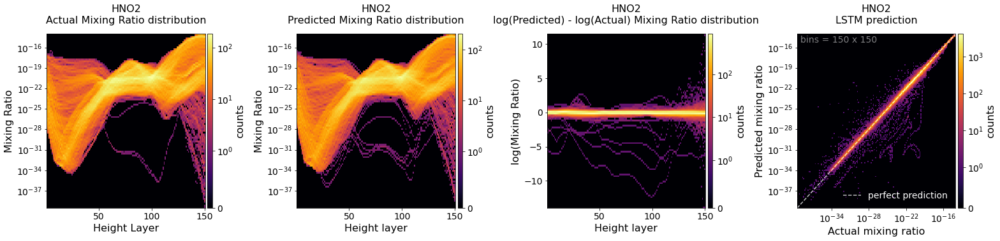

H2O2


100%|██████████| 150/150 [00:00<00:00, 203.18it/s]


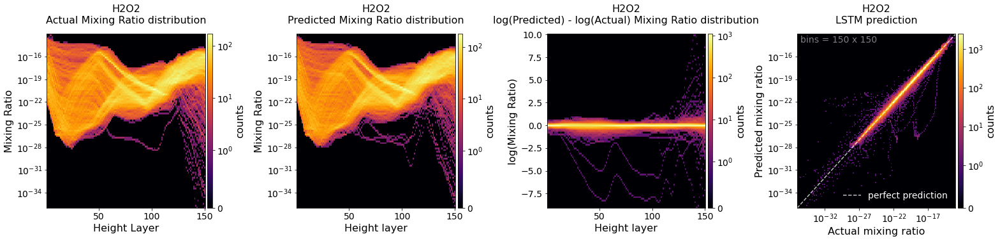

NO2


100%|██████████| 150/150 [00:00<00:00, 202.60it/s]


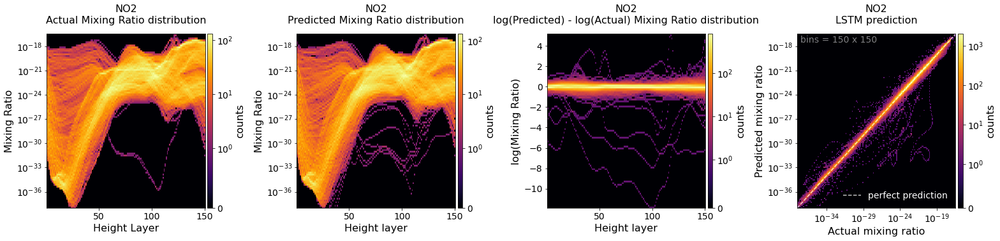

In [113]:
mean_mixing_ratios_per_species = np.mean(x, axis=(0, -1))
sorted_mmrps = np.argsort(mean_mixing_ratios_per_species)[::-1]

for i in sorted_mmrps:
    spec = spec_list[i]
    print(f'{spec}')
    dist_plot_2d(
        x[:, i, :],
        x_pred[:, i, :],
        nbins=100,
        spec_name=spec
    )

In [5]:
def plot_time_differences():
    # VULCAN times
    std_files = glob.glob(f'{std_output_dir}/*.txt')
    print(f'{len(std_files)} files found')

    vulcan_times = []
    invalid_files = 0
    for i, std_file in tqdm(enumerate(std_files), total=len(std_files)):
        with open(std_file, 'r') as f:
            lines = f.read().splitlines()
            if len(lines) == 0:
                invalid_files += 1
                continue
            last_line = lines[-1]
            vulcan_time = float(last_line.split(' ')[-2]) * 60 # seconds
            vulcan_times.append(vulcan_time)

    print(f'{invalid_files} files had no data')

    print(f'{np.mean(vulcan_times) = }')
    print(f'{np.median(vulcan_times) = }')
    print(f'{np.std(vulcan_times) = }')
    print(f'{np.min(vulcan_times) = }')
    print(f'{np.max(vulcan_times) = }')

    # core times
    print(f'{np.mean(core_times) = }')
    print(f'{np.median(core_times) = }')
    print(f'{np.std(core_times) = }')
    print(f'{np.min(core_times) = }')
    print(f'{np.max(core_times) = }')

    # plot
    fig, ax = plt.subplots(figsize=(5,5))

    # edges = np.logspace(0, np.log10(np.max(vulcan_times)), num=100)
    # edges = np.linspace(0, np.max(vulcan_times), num=100)

    ax.hist(vulcan_times, bins=100)

    # ax.set_xscale('log')
    # ax.set_yscale('log')

    ax.set_xlabel('Vulcan Time [s]')
    ax.set_ylabel('Count')
    ax.set_title('Time Distribution')

    plt.tight_layout()
    plt.show()

    # plot
    fig, ax = plt.subplots(figsize=(5,5))

    # edges = np.logspace(0, np.log10(np.max(vulcan_times)), num=100)
    # edges = np.linspace(0, np.max(vulcan_times), num=100)

    ax.hist(core_times, bins=100)

    # ax.set_xscale('log')
    # ax.set_yscale('log')

    ax.set_xlabel('Time [s]')
    ax.set_ylabel('Count')
    ax.set_title('NN Time Distribution')

    plt.tight_layout()
    plt.show()


13391 files found


100%|██████████| 13391/13391 [00:01<00:00, 6996.24it/s]


48 files had no data
np.mean(vulcan_times) = 9621.453299286448
np.median(vulcan_times) = 5994.311854839325
np.std(vulcan_times) = 11855.220278467728
np.min(vulcan_times) = 1236.7391431331635
np.max(vulcan_times) = 102223.04540514946
np.mean(core_times) = 0.7947652749733878
np.median(core_times) = 0.7908747009932995
np.std(core_times) = 0.011067425452835877
np.min(core_times) = 0.7028557510348037
np.max(core_times) = 0.9288745060330257


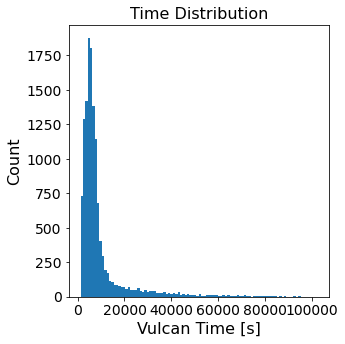

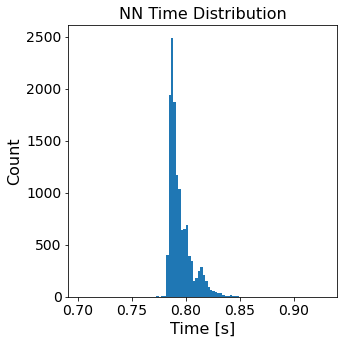

In [6]:
plot_time_differences()

In [116]:
def plot_std_log_error(x, x_pred, nbins=150):
    std_per_h = np.std(x, axis=(1, 2))

    f, ax = plt.subplots(figsize=(5,5))
    ax.plot(
        std_per_h
    )
    plt.show()

    log_errors = np.log(x_pred) - np.log(x) # (150, 69, n_examples)
    log_errors_per_h = np.mean(log_errors, axis=(1, 2))

    f, ax = plt.subplots(figsize=(5,5))
    ax.plot(
        log_errors_per_h
    )
    plt.show()

    f, ax = plt.subplots(figsize=(5,5))
    ax.scatter(
        std_per_h,
        log_errors_per_h
    )
    plt.show()

    std_per_h_per_s = np.std(x, axis=2) # (150, 69)
    log_errors_per_h_per_s = np.mean(np.abs(log_errors), axis=2)

    f, ax = plt.subplots(figsize=(5,5))
    im = ax.imshow(
        log_errors_per_h_per_s.T,
        cmap='inferno',
        origin='lower',
        aspect='auto',
        norm=LogNorm(),
        interpolation='none'
    )

    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='3%', pad=0.05)
    cbar = f.colorbar(im, cax=cax, orientation='vertical')
    cbar.set_label('abs log error')

    plt.show()

    f, ax = plt.subplots(figsize=(5,5))
    im = ax.imshow(
        std_per_h_per_s.T,
        cmap='inferno',
        origin='lower',
        aspect='auto',
        norm=LogNorm(),
        interpolation='none'
    )

    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='3%', pad=0.05)
    cbar = f.colorbar(im, cax=cax, orientation='vertical')
    cbar.set_label('std')

    plt.show()

    # bins
    x_bins = np.linspace(std_per_h_per_s.min(), std_per_h_per_s.max(), nbins+1)
    y_bins = np.linspace(0, 0.5, nbins+1)

    f, ax = plt.subplots(figsize=(5,5))

    H = ax.hist2d(
        std_per_h_per_s.flatten(),
        log_errors_per_h_per_s.flatten(),
        bins=nbins,
        norm=SymLogNorm(linthresh=log_errors_per_h_per_s.min()),
    )

    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='3%', pad=0.05)
    cbar = f.colorbar(H[3], cax=cax, orientation='vertical')
    cbar.set_label('counts')

    plt.show()

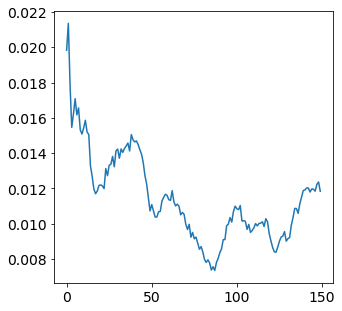

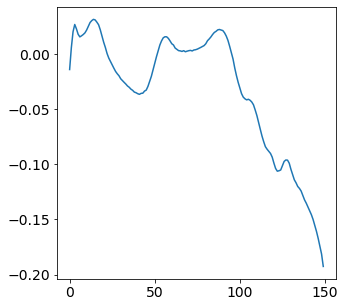

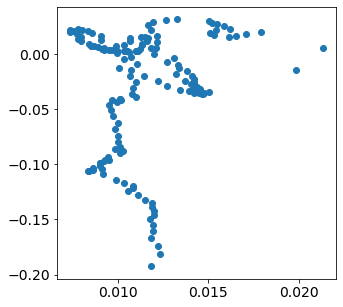

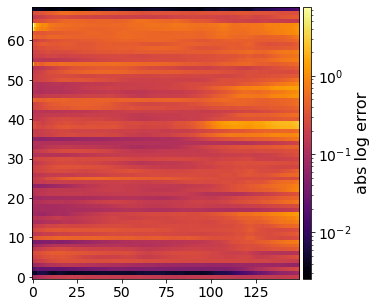

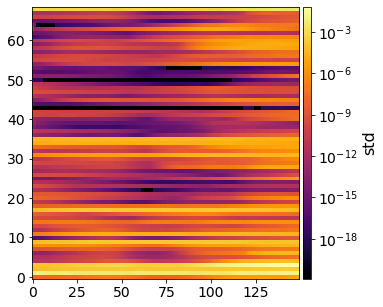

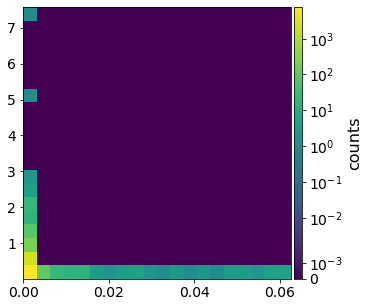

In [117]:
plot_std_log_error(x, x_pred, nbins=20)